In [1]:
from itertools import chain

import anndata as ad
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import seaborn as sns

sc.logging.print_header()

Package,Version
anndata,0.10.8
matplotlib,3.9.1
numpy,1.26.4
pandas,2.2.1
scanpy,1.11.2
seaborn,0.13.2
Component,Info
Python,"3.12.2 | packaged by conda-forge | (main, Feb 16 2024, 20:50:58) [GCC 12.3.0]"
OS,Linux-4.18.0-553.8.1.el8_10.x86_64-x86_64-with-glibc2.28
CPU,"128 logical CPU cores, x86_64"


In [2]:
%matplotlib inline
matplotlib.rcParams["figure.figsize"] = (7.0, 7.0)

In [3]:
aggregation = pd.read_csv("../samples.csv")
aggregation

,sample_id,population
0,C1_GEX,adult
1,C3_GEX,adult
2,C4_GEX,adult
3,E2_GEX,embryo
4,E3_GEX,embryo
5,E4_GEX,embryo


In [4]:
adatas = []
for idx, row in aggregation.iterrows():
    this_adata = sc.read_10x_h5(
        f"../1-cellranger/out/{row.sample_id}/outs/filtered_feature_bc_matrix.h5"
    )
    this_adata.var_names_make_unique()
    this_adata.obs["sample_id"] = row.sample_id
    this_adata.obs["population"] = row.population
    adatas.append(this_adata)

adata = ad.concat(adatas)
adata.obs_names_make_unique()

/home/rac266/data/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/rac266/data/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/rac266/data/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/rac266/data/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/rac266/data/miniforge3/envs/scanpy/lib/python3.12/site-pac

In [5]:
adata

AnnData object with n_obs × n_vars = 76737 × 16779
    obs: 'sample_id', 'population'

In [6]:
adata.obs.groupby("sample_id").size()

sample_id
C1_GEX    13168
C3_GEX    11095
C4_GEX    10473
E2_GEX    11778
E3_GEX    12130
E4_GEX    18093
dtype: int64

In [7]:
# Calculate the number of genes expressed per cell
adata.obs['n_genes_by_counts'] = (adata.X > 0).sum(axis=1)

# Calculate the mean number of genes per cell
mean_genes_per_cell = np.mean(adata.obs['n_genes_by_counts'])

print(f"Mean number of genes per cell: {mean_genes_per_cell}")

Mean number of genes per cell: 735.479612181868


In [8]:
sc.pp.filter_cells(adata, min_genes=1)

In [9]:
ribo_genes = adata.var_names.str.contains("^RP[LS]", case=False)
adata.obs["percent_ribo"] = (
    np.sum(adata[:, ribo_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 * 100
)

In [10]:
mito_genes_list = [
    "ND1",
    "ND2",
    "COX1",
    "COX2",
    "ATP8",
    "ATP6",
    "COX3",
    "ND3",
    "ND4L",
    "ND4",
    "ND5",
    "CYTB",
    "ND6",
]
mito_genes = adata.var_names.isin(mito_genes_list)
adata.obs['percent_mito'] = (
    np.sum(adata[:, mito_genes].X, axis=1).A1
    / np.sum(adata.X, axis=1).A1
    * 100
)

In [11]:
adata.obs

,sample_id,population,n_genes_by_counts,n_genes,percent_ribo,percent_mito
AAACCAAAGAACACCC-1,C1_GEX,adult,321,321,9.314587,0.000000
AAACCAAAGAGGCGTA-1,C1_GEX,adult,306,306,5.362319,1.594203
AAACCAAAGGCAATTT-1,C1_GEX,adult,472,472,3.717472,0.000000
AAACCAGCAAAGTCTC-1,C1_GEX,adult,768,768,5.315402,0.000000
AAACCAGCACTCACTC-1,C1_GEX,adult,466,466,4.271632,0.000000
...,...,...,...,...,...,...
GTTGTGGGTATCGCAG-1,E4_GEX,embryo,218,218,10.805861,0.366300
GTTGTGGGTCAAGGCC-1,E4_GEX,embryo,531,531,6.583463,0.031201
GTTGTGGGTCCTGTAC-1,E4_GEX,embryo,468,468,5.387205,0.000000
GTTGTGGGTCTTGATT-1,E4_GEX,embryo,544,544,4.866117,0.025747


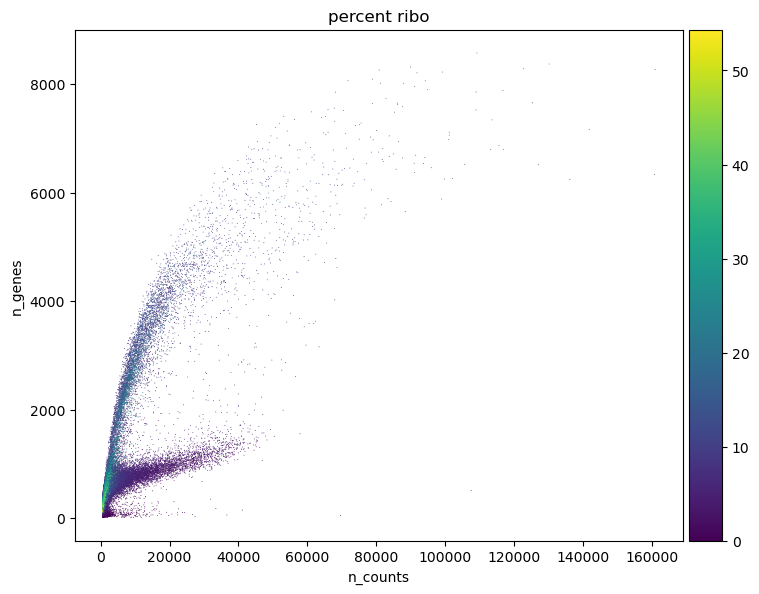

In [12]:
adata.obs["n_counts"] = adata.X.sum(axis=1).A1
sc.pl.scatter(adata, x="n_counts", y="n_genes", color="percent_ribo")

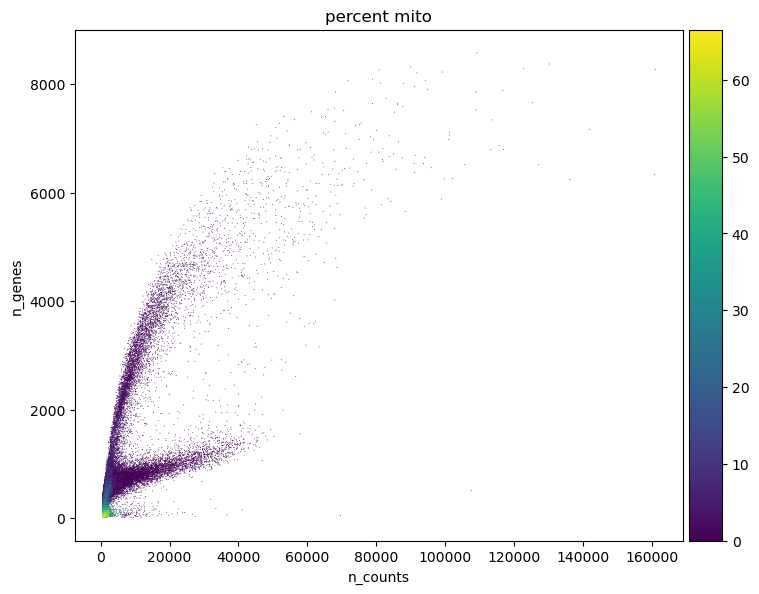

In [13]:
sc.pp.filter_genes(adata, min_cells=3)
adata.obs["n_counts"] = adata.X.sum(axis=1).A1
sc.pl.scatter(adata, x="n_counts", y="n_genes", color="percent_mito")

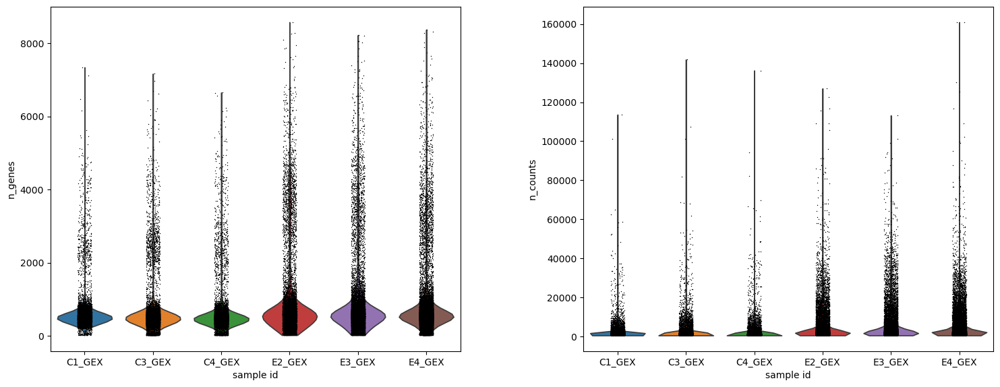

In [14]:
sc.pl.violin(adata, ["n_genes", "n_counts"], groupby="sample_id")

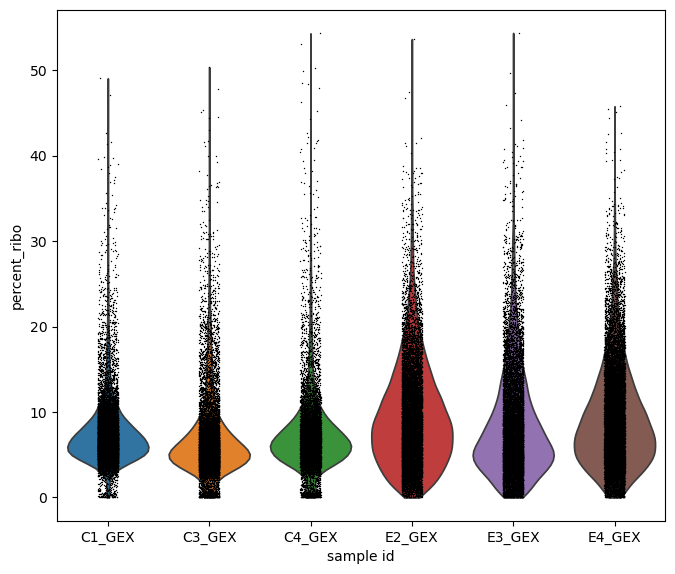

In [15]:
sc.pl.violin(adata, ["percent_ribo"], groupby="sample_id")

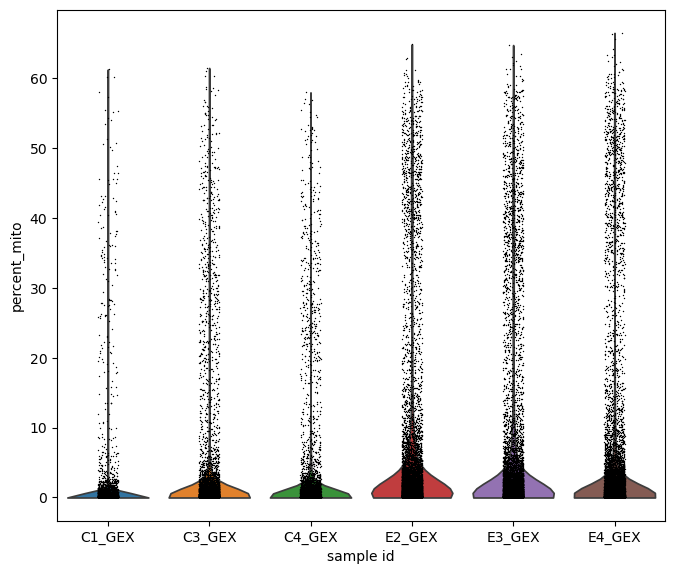

In [16]:
sc.pl.violin(adata, ["percent_mito"], groupby="sample_id")

In [17]:
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_cells(adata, max_genes=6000)
sc.pp.filter_cells(adata, max_counts=50000)
adata = adata[adata.obs["percent_ribo"] <= 15, :]
adata = adata[adata.obs["percent_mito"] <= 15, :]
adata

View of AnnData object with n_obs × n_vars = 37608 × 15590
    obs: 'sample_id', 'population', 'n_genes_by_counts', 'n_genes', 'percent_ribo', 'percent_mito', 'n_counts'
    var: 'n_cells'
    uns: 'sample_id_colors'

In [18]:
# Calculate the number of genes expressed per cell
adata.obs['n_genes_by_counts'] = (adata.X > 0).sum(axis=1)

# Calculate the mean number of genes per cell
mean_genes_per_cell = np.mean(adata.obs['n_genes_by_counts'])

print(f"Mean number of genes per cell: {mean_genes_per_cell}")

Mean number of genes per cell: 969.208413103595


/tmp/ipykernel_1933148/2143162957.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes_by_counts'] = (adata.X > 0).sum(axis=1)


In [19]:
adata.obs.groupby("sample_id").size()

/tmp/ipykernel_1933148/2234999136.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby("sample_id").size()


sample_id
C1_GEX    6327
C3_GEX    4665
C4_GEX    3824
E2_GEX    6213
E3_GEX    6678
E4_GEX    9901
dtype: int64

In [20]:
adata.write("raw_counts.h5ad")  # we'll need this later, for DE analysis

In [21]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ["n_counts"])
sc.pp.scale(adata)

/home/rac266/data/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:729: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


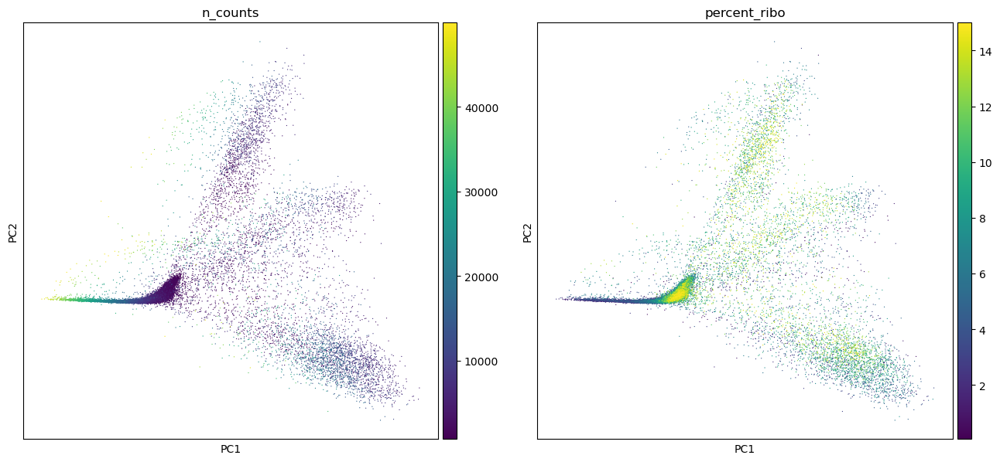

In [22]:
sc.tl.pca(adata)
sc.pl.pca(adata, color=["n_counts", "percent_ribo"])

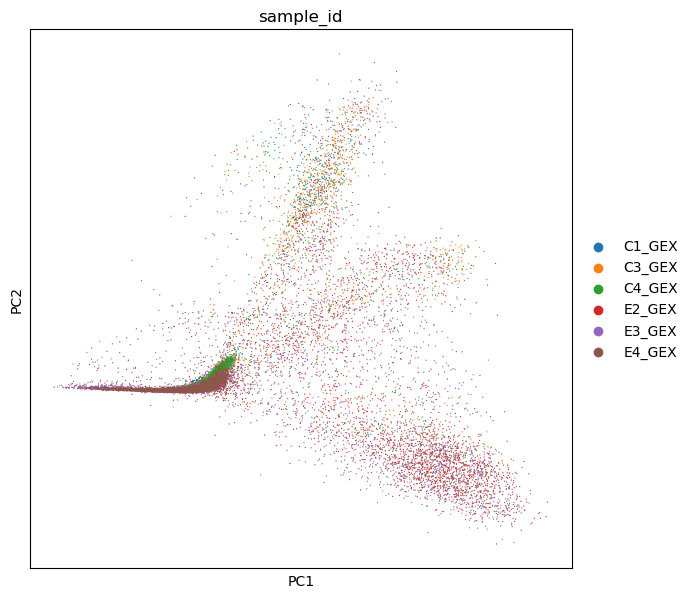

In [23]:
sc.pl.pca(adata, color=["sample_id"])

In [24]:
import harmonypy

In [25]:
sce.pp.harmony_integrate(adata, "sample_id", max_iter_harmony=50)

2026-01-08 14:11:36,485 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-01-08 14:11:46,358 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-08 14:11:46,591 - harmonypy - INFO - Iteration 1 of 50
2026-01-08 14:11:53,107 - harmonypy - INFO - Iteration 2 of 50
2026-01-08 14:11:59,615 - harmonypy - INFO - Iteration 3 of 50
2026-01-08 14:12:05,830 - harmonypy - INFO - Converged after 3 iterations


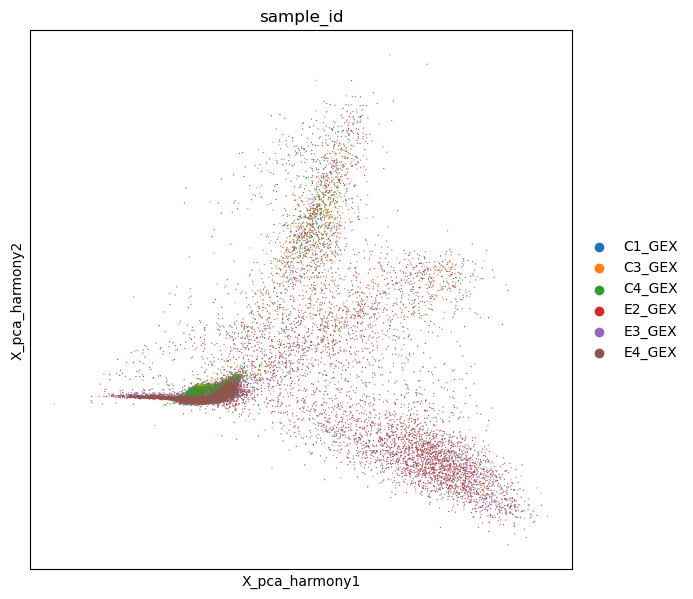

In [26]:
sc.pl.embedding(adata, basis="X_pca_harmony", color=["sample_id"])

In [27]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20, use_rep="X_pca_harmony")

2026-01-08 14:12:34.904352: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-01-08 14:12:34.908449: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2026-01-08 14:12:34.916777: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1767903154.928848 1933148 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1767903154.932678 1933148 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-01-08 14:12:34.948400: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [28]:
sc.tl.umap(adata)

In [29]:
import leidenalg

In [30]:
sc.tl.leiden(adata, resolution=0.3)

/tmp/ipykernel_1933148/3347713724.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.3)


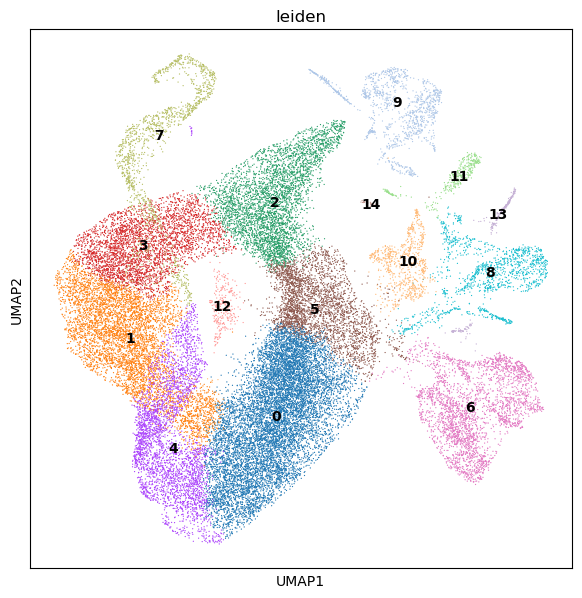

In [31]:
sc.pl.umap(adata, color=["leiden"], legend_loc="on data", save="_clusters")

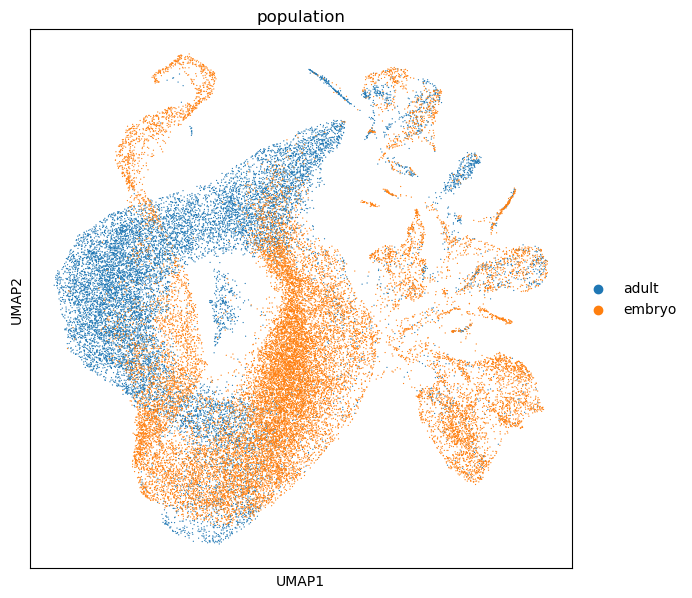

In [32]:
sc.pl.umap(adata, color=["population"], save="_by_population")

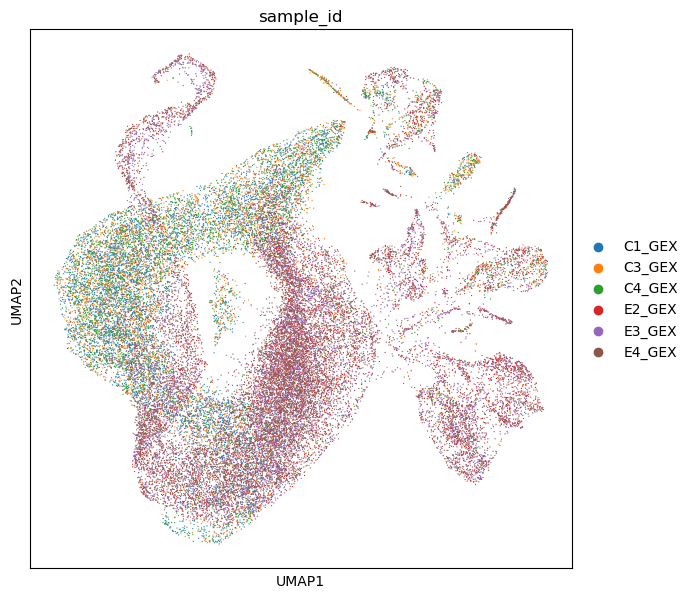

In [33]:
sc.pl.umap(adata, color=["sample_id"], save="_by_sample")

In [34]:
sc.tl.rank_genes_groups(adata, groupby="leiden")
marker_genes_table = pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(20).T
marker_genes_table.to_csv("marker_genes.csv")
marker_genes_table

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,CA2,HBAD,HBA1,TPT1,HBBA,ITGB1BP3,BPGM,EIF3E,EEF2,CA13,RPS24,HBE1,EIF3H,FTH1,ADAL,NT5DC2,RPL4,RPLP1,RPSAP58,NCOA4
1,B2M,HBBA,IFI27L2,HBA1,BF2,WBP4,IRF1,GPX1,BF1,CREG1,AK2,FTH1,H3F3C,HBAD,CA2,ENSGALG00000022875,ITM2A,BG8,ENSGALG00000051188,TAPBP
2,EIF1,CNBP,ENSGALG00000004509,FTH1,CREG1,ENSGALG00000022875,HINTW,ITM2A,H3F3C,IFI27L2,TAL1,B2M,EDF1,HMGN1,PSMD9,SUMO2,ITM2B,HEXIM1,ATP6V0C,RSRP1
3,B2M,IFI27L2,CREG1,BF2,ENSGALG00000004509,H3F3C,BF1,ITM2A,ENSGALG00000022875,FTH1,EDF1,HINTW,AK2,IRF1,WBP4,ITM2B,NFE2L2,CNBP,ATRX,BRI3
4,HBAD,HBA1,HBBA,HBE1,TSPO2,YBX3,CA2,TPT1,ENSGALG00000053241,ADAL,NT5C3A,NCOA4,GLRX,UROD,TMOD4,GSTA4,NT5DC2,ITGB1BP3,ACTG1,EPB42
5,CA2,FTH1,BPGM,CA13,RPL37A,ITGB1BP3,RPS19,HBA1,RPS10,EEF2,HBAD,HBBA,RPLP1,RPS24,RPL30,EIF1,WBP4,RPLP2,RPS11,RFESD
6,SPARC,COL6A3,DCN,COL5A1,COL6A2,ENSGALG00000050132,COL3A1,FN1,COX3,MMP2,GPX3,NFIA,COII,COL1A1,ATP6,MT-CO1,RBM3,COL6A1,COL5A2,MGP
7,HBE1,HBAD,HBBA,HBA1,TUBB1,TSPO2,SLC4A1,TMOD4,GSTA4,UROD,ITPK1,SEPTIN9,EPB42,MGST3,PPOX,E2F1,ENSGALG00000015240,ENSGALG00000053241,SLC25A37,SLC7A5
8,TMSB4X,ENSGALG00000043329,PPIA,ENSGALG00000050132,MT-CO1,ACTB,COII,CYTB,COX3,ACTG1,ATP6,CALM1,ND5,MYH9,FKBP1A,ITGB1,SPTBN1,DSTN,ND1,ND4
9,TMSB4X,ACTB,IFI30,CD74,ENSGALG00000050132,ACTG1,BLB2,DSTN,PPIA,CORO1C,LAPTM5,GAPDH,LSP1P1,MT-CO1,ENSGALG00000051101,LCP1,ZFP36L1,ENSGALG00000043329,COX3,RASSF2


In [35]:
names_df = pd.DataFrame(adata.uns["rank_genes_groups"]["names"])
pvals_df = pd.DataFrame(adata.uns["rank_genes_groups"]["pvals_adj"])
lfc_df = pd.DataFrame(adata.uns["rank_genes_groups"]["logfoldchanges"])

adata.raw.var["percent_cells_expressing"] = (
    np.sum(adata.raw.X > 0, axis=0).A1 / adata.raw.X.shape[0] * 100
)

with open("all_markers.csv", "w") as markers_out:
    print(
        ",".join(["cluster", "gene", "pval_adj", "LFC", "pct.1", "pct.2"]),
        file=markers_out,
    )
    for cluster in sorted(map(int, adata.obs.leiden.unique())):
        names = names_df.iloc[:, cluster]
        pvals = pvals_df.iloc[:, cluster]
        lfcs = lfc_df.iloc[:, cluster]
        for name, pval, lfc in zip(names, pvals, lfcs):
            if pval < 1e-2 and lfc > 1:
                pct1 = (
                    np.sum(
                        adata.raw.X[
                            adata.obs.leiden == str(cluster),
                            adata.raw.var_names == name,
                        ]
                        > 0
                    )
                    / sum(adata.obs.leiden == str(cluster))
                    * 100
                )
                pct2 = adata.raw.var.percent_cells_expressing[name]
                print(
                    ",".join(map(str, [cluster, name, pval, lfc, pct1, pct2])),
                    file=markers_out,
                )

In [36]:
adata.write("clusters_original.h5ad")

In [37]:
adata.obs.groupby("leiden").count().sample_id

/tmp/ipykernel_1933148/4097094263.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby("leiden").count().sample_id


leiden
0     10000
1      5214
2      4030
3      3449
4      3412
5      3129
6      2878
7      1376
8      1262
9      1200
10      757
11      340
12      277
13      245
14       39
Name: sample_id, dtype: int64

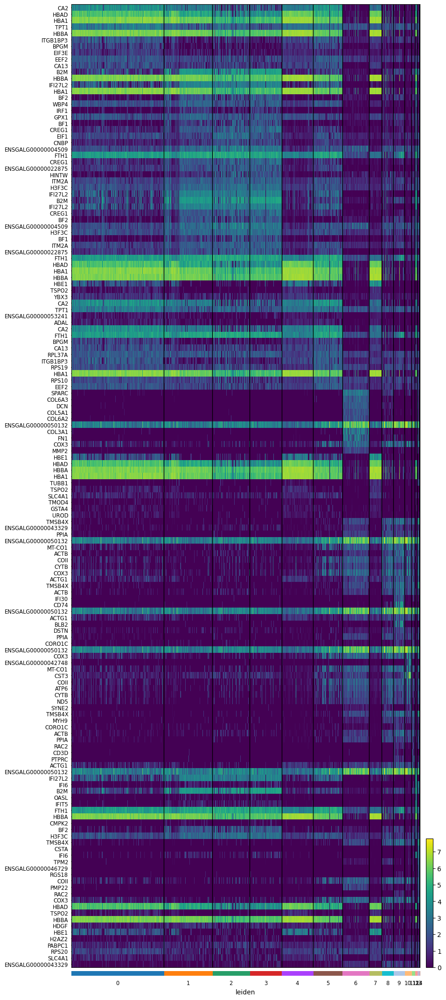

In [38]:
marker_genes_list = list(chain(*marker_genes_table.iloc[:,:10].values))
sc.pl.heatmap(
    adata,
    var_names=marker_genes_list,
    groupby="leiden",
    swap_axes=True,
    show_gene_labels=True,
    save="_top10_markers.pdf"
)

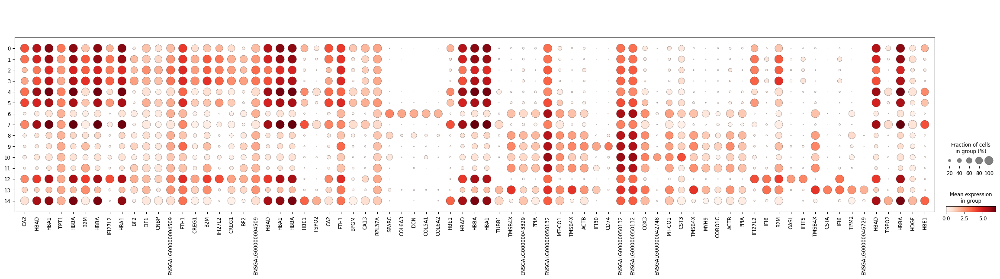

In [39]:
marker_genes_list = list(chain(*marker_genes_table.iloc[:,:5].values))
sc.pl.dotplot(
    adata,
    var_names=marker_genes_list,
    groupby="leiden",
    save="_top5_markers.pdf"
)

In [40]:
colors = [(0.9, 0.9, 0.9), (0.7, 0, 0)]
cm = matplotlib.colors.LinearSegmentedColormap.from_list(
        "Custom", colors, N=40)
sc.set_figure_params(frameon=False, transparent=True)
matplotlib.rcParams["figure.figsize"] = (7.0, 7.0)
matplotlib.rcParams["font.size"] = 18

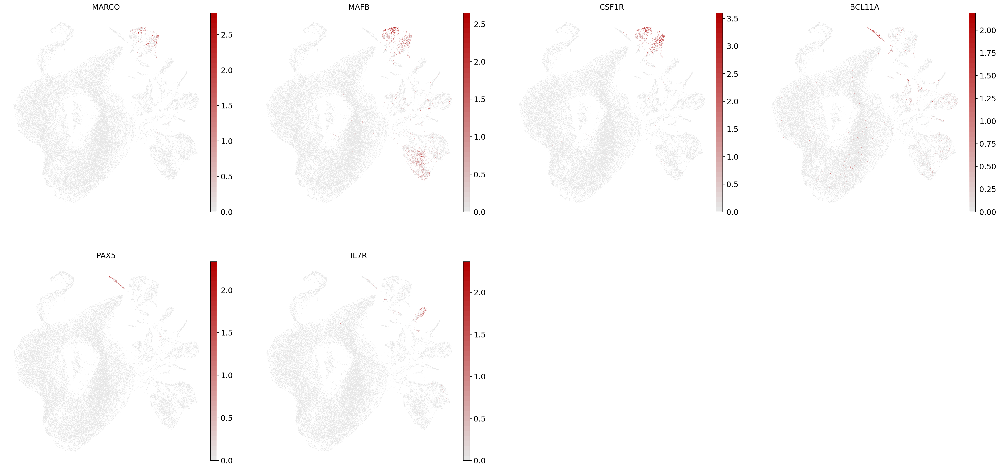

In [41]:
immune_genes = [
    "MARCO", "MAFB", "CSF1R", "BCL11A", "PAX5", "IL7R"
]
sc.pl.umap(
    adata,
    color=immune_genes,
    color_map=cm,
    save="_immune_genes.pdf",
    #title=t_cell_genes.symbol,
)

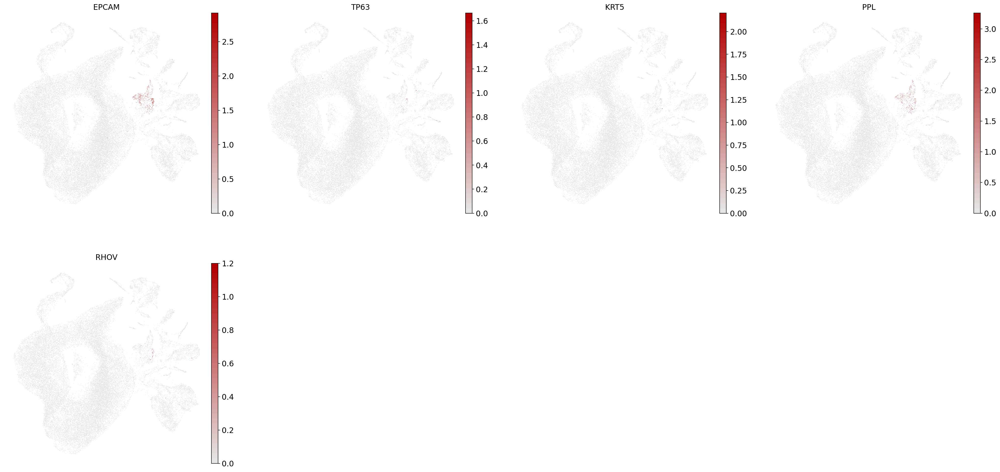

In [42]:
epithelial_genes = [
    "EPCAM", "TP63", "KRT5", "PPL", "RHOV"
    
]
sc.pl.umap(
    adata,
    color=epithelial_genes,
    color_map=cm,
    save="_epithelial_genes.pdf",
    #title=t_cell_genes.symbol,
)

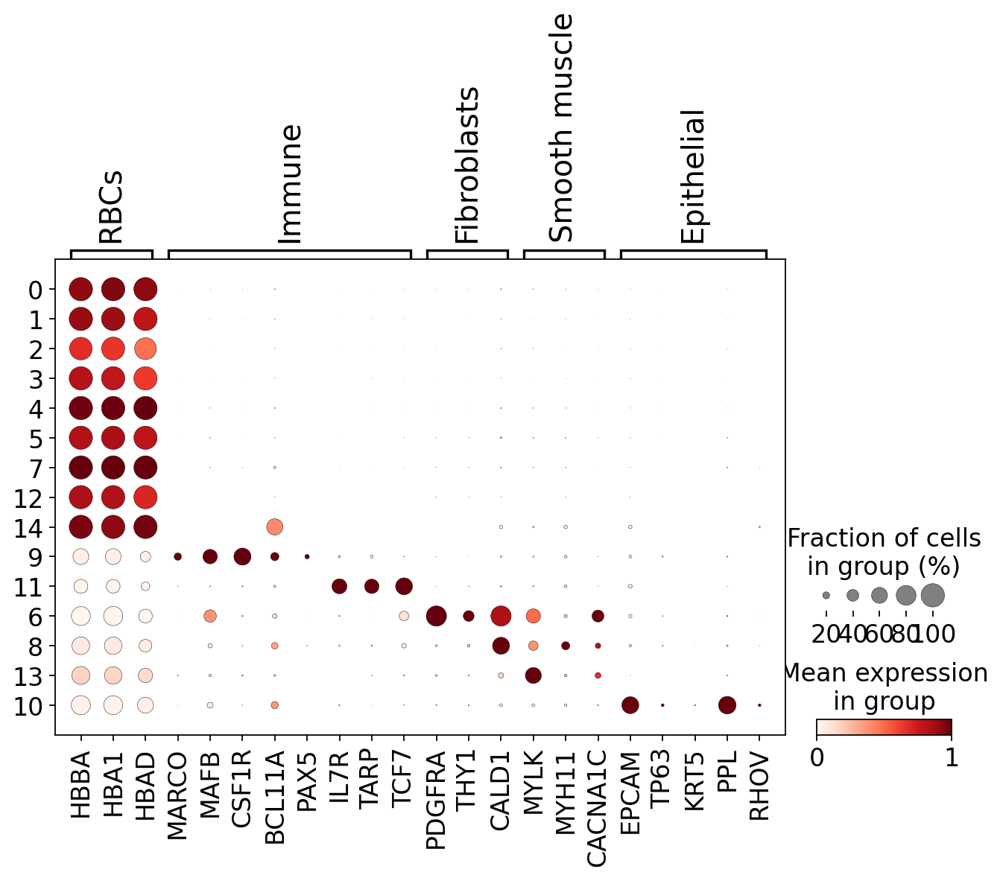

In [44]:
# Define the custom order for clusters (descending) on the Y-axis
cluster_order = [0, 1, 2, 3, 4, 5, 7, 12, 14, 9, 11, 6, 8, 13, 10]
cluster_order = [str(c) for c in cluster_order]  # Ensure leiden values are strings

# Your existing marker genes dictionary
marker_genes = {
    "RBCs": ["HBBA", "HBA1", "HBAD"],
    "Immune": ["MARCO", "MAFB", "CSF1R", "BCL11A", "PAX5", "IL7R", "TARP", "TCF7"],
    "Fibroblasts":["PDGFRA", "THY1", "CALD1"],
    "Smooth muscle":["MYLK", "MYH11", "CACNA1C"],
    "Epithelial":[ "EPCAM", "TP63", "KRT5", "PPL", "RHOV"],
}

# Ensure leiden is categorical and set the correct order
adata.obs["leiden"] = adata.obs["leiden"].astype("category")
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(cluster_order, ordered=True)

# Create the dot plot with clusters on the Y-axis in descending order
sc.pl.dotplot(
    adata, marker_genes, 
    groupby="leiden", 
    standard_scale="var", 
    swap_axes=False,  # Keep clusters on Y-axis (default)
    save="FINAL-dotplot.pdf"

)

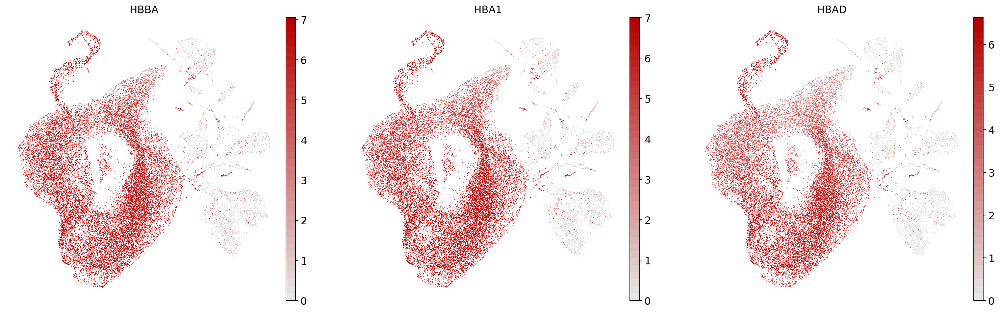

In [45]:
rbc_genes = [
    "HBBA", "HBA1", "HBAD"
]
sc.pl.umap(
    adata,
    color=rbc_genes,
    color_map=cm,
    save="_rbc_genes.pdf",
    #title=t_cell_genes.symbol,
)